<a href="https://colab.research.google.com/github/priyasa399/Music_Genre_Classification/blob/main/Music_Genre_Classification_Using_CNN_and_KNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Music Genre Classification using CNN and KNN and comparing their performances

### Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd '/content/drive'

/content/drive


In [ ]:
cd 'My Drive'

/content/drive/My Drive


In [ ]:
cd "Data"

/content/drive/My Drive/Data


In [ ]:
pwd

'/content/drive/My Drive/Data'

### Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
import sys
import pickle
import os, json, math, librosa
import librosa.display
from IPython.display import Audio
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import tensorflow as tf
from tensorflow import keras

### Reading CSV File

In [ ]:
df = pd.read_csv('/content/drive/My Drive/Data/features_3_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


### Exploring Dataset

In [ ]:
df.shape

(9990, 60)

In [ ]:
df.dtypes

filename                    object
length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [ ]:
df = df.drop(labels='filename',axis=1)

### Understanding the Audio Files

Librosa is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems. By using Librosa, we can extract certain key features from the audio samples such as Tempo, Chroma Energy Normalized etc.

In [ ]:
audio_recording = "/content/drive/My Drive/Data/genres_original/country/country.00050.wav"
data , sr = librosa.load(audio_recording)
print(type(data), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [ ]:
librosa.load(audio_recording, sr=45600)

(array([ 0.04582627,  0.06254332,  0.0583379 , ..., -0.13857861,
        -0.11823352, -0.05911855], dtype=float32), 45600)

With the help of IPython.display.Audio we can play audio in the notebook. It is a library used for playing audio files.

In [ ]:
import IPython
IPython.display.Audio(data, rate=sr)

#### 1. Plotting Raw Wave Files

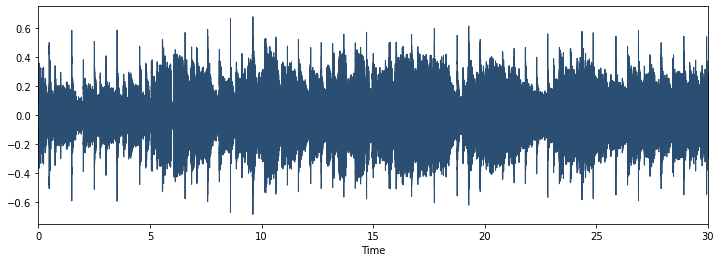

In [ ]:
plt.figure(figsize=(12,4))
librosa.display.waveplot(data, color = "#2B4F72")
plt.show()

#### 2. Spectrograms

A spectrogram is a visual way of representing the signal loudness of a signal over time at various frequencies present in a particular waveform. Not only can one see whether there is more or less energy at, for example, 2 Hz vs 10 Hz, but one can also see how energy levels vary over time.

/usr/local/lib/python3.7/dist-packages/librosa/display.py:955: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  "Trying to display complex-valued input. " "Showing magnitude instead."


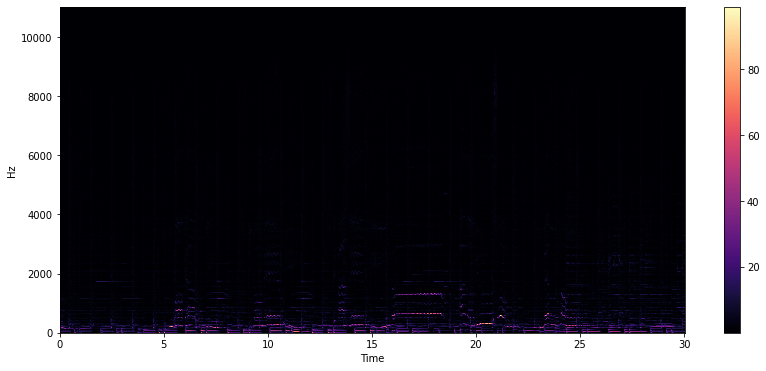

In [ ]:
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(14,6))
librosa.display.specshow(stft,sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

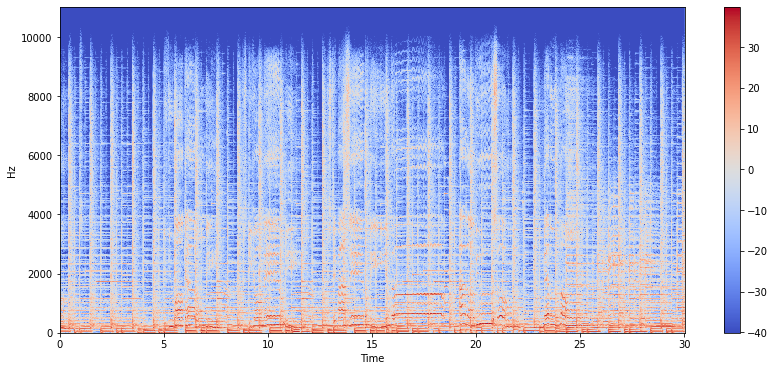

In [ ]:
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(14,6))
librosa.display.specshow(stft_db,sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

#### 3. Spectral Rolloff

Spectral Rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

**librosa.feature.spectral_rolloff** computes the rolloff frequency for each frame in a signal.

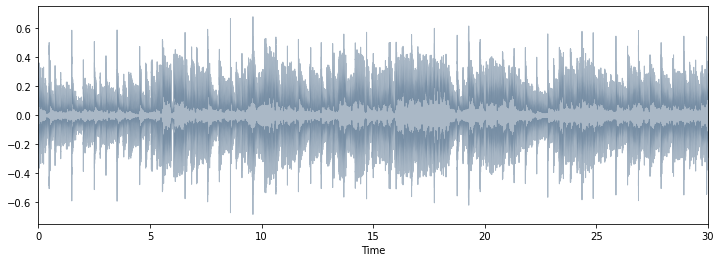

In [ ]:
from sklearn.preprocessing import normalize
spectral_rolloff = librosa.feature.spectral_rolloff(data+0.01, sr=sr)[0]
plt.figure(figsize=(12,4))
librosa.display.waveplot(data, sr=sr, alpha=0.4, color="#2B4F72")

#### 4. Chroma Feature

It is a powerful tool for analyzing music features whose pitches can be meaningfully categorized and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music while being robust to changes in timbre and instrumentation. 

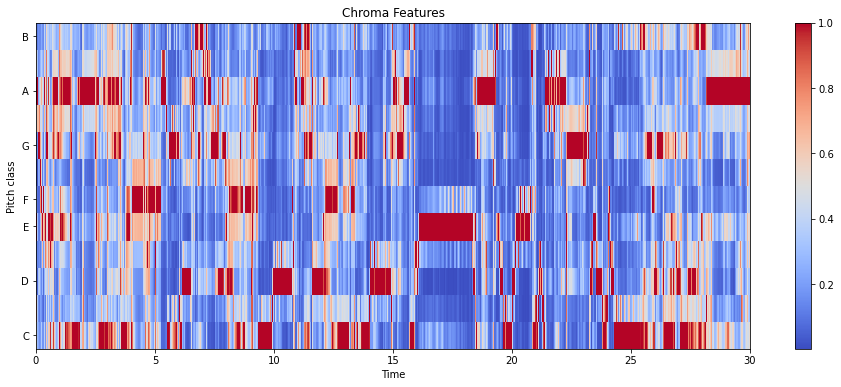

In [ ]:
import librosa.display as lplt
chroma = librosa.feature.chroma_stft(data, sr=sr)
plt.figure(figsize=(16,6))
lplt.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar()
plt.title("Chroma Features")
plt.show()

#### 5. Zero Crossing Rate

Zero crossing is said to occur if successive samples have different algebraic signs. The rate at which zero-crossings occur is a simple measure of the frequency content of a signal. Zero-crossing rate is a measure of the number of times in a given time interval/frame that the amplitude of the speech signals passes through a value of zero.

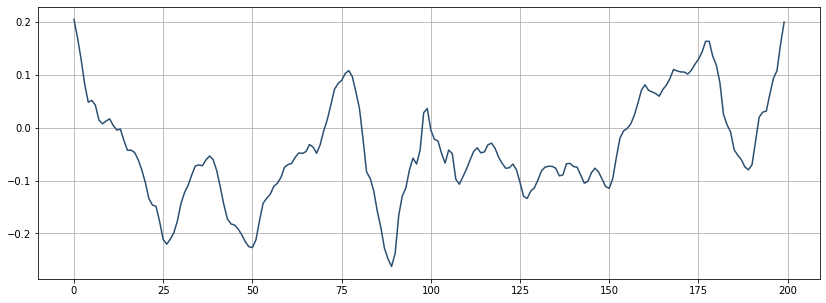

In [ ]:
start = 1000
end = 1200
plt.figure(figsize=(14,5))
plt.plot(data[start:end], color="#2B4F72")
plt.grid()

In [ ]:
zero_cross_rate = librosa.zero_crossings(data[start:end], pad=False)
print("The number of zero-crossings is :",sum(zero_cross_rate))

The number of zero-crossings is : 8


### Feature Extraction

In [ ]:
class_list = df.iloc[:, -1]
convertor = LabelEncoder()

In [ ]:
y = convertor.fit_transform(class_list)

In [ ]:
y

array([0, 0, 0, ..., 9, 9, 9])

In [ ]:
dict = {0: 'blues', 1: 'classical', 2: 'country', 3: 'disco', 4: 'hiphop', 5: 'jazz', 6: 'metal', 7: 'pop', 8: 'reggae', 9: 'rock'}


In [ ]:
print(df.iloc[:, :-1])

      length  chroma_stft_mean  ...  mfcc20_mean  mfcc20_var
0      66149          0.335406  ...    -0.243027   43.771767
1      66149          0.343065  ...     5.784063   59.943081
2      66149          0.346815  ...     2.517375   33.105122
3      66149          0.363639  ...     3.630866   32.023678
4      66149          0.335579  ...     0.536961   29.146694
...      ...               ...  ...          ...         ...
9985   66149          0.349126  ...     1.818823   38.966969
9986   66149          0.372564  ...     0.428857   18.697033
9987   66149          0.347481  ...    -0.299545   41.586990
9988   66149          0.387527  ...     0.675824   12.787750
9989   66149          0.369293  ...    -3.412534   31.727489

[9990 rows x 58 columns]


### Scaling the Features

In [ ]:
from sklearn.preprocessing import StandardScaler
fit = StandardScaler()
X = fit.fit_transform(np.array(df.iloc[:,:-1], dtype = float))

### Dividing Data into Training and Testing Sets

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [ ]:
len(y_train)

6693

In [ ]:
len(y_test)

3297

### **Convolutional Neural Networks (CNN)**

### Building the CNN based model

In [ ]:
from keras.models import Sequential

In [ ]:
def trainModel(model, epochs, optimizer):
  batch_size = 128
  model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics='accuracy')
  return model.fit(X_train, y_train, validation_data=(X_test,y_test), epochs=epochs, batch_size=batch_size)

In [ ]:
def plotValidate(history):
  print("Validation Accuracy",max(history.history["val_accuracy"]))
  pd.DataFrame(history.history).plot(figsize=(12,6))
  plt.show()

In [ ]:
def predict(model, X, y):
    """Predict a single sample using the trained model
    :param model: Trained classifier
    :param X: Input data
    :param y (int): Target
    """

    # add a dimension to input data for sample - model.predict() expects a 4d array in this case
    X = X[np.newaxis, ...] # array shape (1, 130, 13, 1)

    # perform prediction
    prediction = model.predict(X)

    # get index with max value
    predicted_index = np.argmax(prediction, axis=1)
    
    # get mappings for target and predicted label
    target = dict[y]
    predicted = dict[predicted_index[0]]

    print("Target: {}, Predicted label: {}".format(target, predicted))

In [ ]:
model = keras.models.Sequential([
                             keras.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
                             keras.layers.Dropout(0.2),

                             keras.layers.Dense(256, activation='relu'),
                             keras.layers.Dropout(0.2),

                             keras.layers.Dense(128, activation='relu'),
                             keras.layers.Dropout(0.2),

                             keras.layers.Dense(64, activation='relu'),
                             keras.layers.Dropout(0.2),

                             keras.layers.Dense(10, activation='softmax'),
                             
])
print(model.summary())
model_history = trainModel(model=model, epochs=600, optimizer='adam')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 512)               30208     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 64)               

### Evaluating the CNN based Model

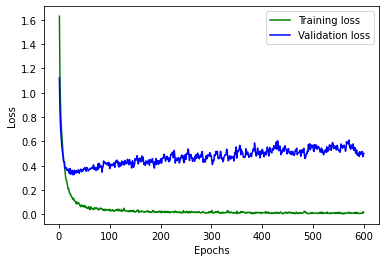

In [ ]:
loss_train = model_history.history['loss']
loss_val = model_history.history['val_loss']
epochs = range(1,601)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=128)
print('Test loss:', test_loss)
print('\nTest accuracy:', test_acc*100)

Test loss: 0.5019870400428772

Test accuracy: 92.81164407730103


In [ ]:
cd ..

/content/drive/My Drive


### Saving the Model

In [ ]:
model.save('music_genre_cnn.h5')

### Loading the Model

In [ ]:
from tensorflow.keras.models import load_model
print("Loading model")
model = load_model('music_genre_cnn.h5')

Loading model


In [ ]:
cd "Data"

/content/drive/My Drive/Data


In [ ]:
pwd

'/content/drive/My Drive/Data'

### Testing the CNN based model using samples from the test set

In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[1]
y_to_predict = y_test[1]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: hiphop, Predicted label: hiphop


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[38]
y_to_predict = y_test[38]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: classical, Predicted label: classical


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[67]
y_to_predict = y_test[67]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: jazz, Predicted label: jazz


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[150]
y_to_predict = y_test[150]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: disco, Predicted label: disco


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[523]
y_to_predict = y_test[523]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: jazz, Predicted label: jazz


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[221]
y_to_predict = y_test[221]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: reggae, Predicted label: reggae


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[809]
y_to_predict = y_test[809]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: rock, Predicted label: rock


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[907]
y_to_predict = y_test[907]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: metal, Predicted label: metal


In [ ]:
# pick a sample to predict from the test set
X_to_predict = X_test[1978]
y_to_predict = y_test[1978]

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: reggae, Predicted label: reggae


### Confusion Matrix for CNN based model

In [ ]:
import sklearn
from sklearn.metrics import confusion_matrix

y_pred = np.argmax(model.predict(X_test), axis=1)
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm,
                     index = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'], 
                     columns = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'])

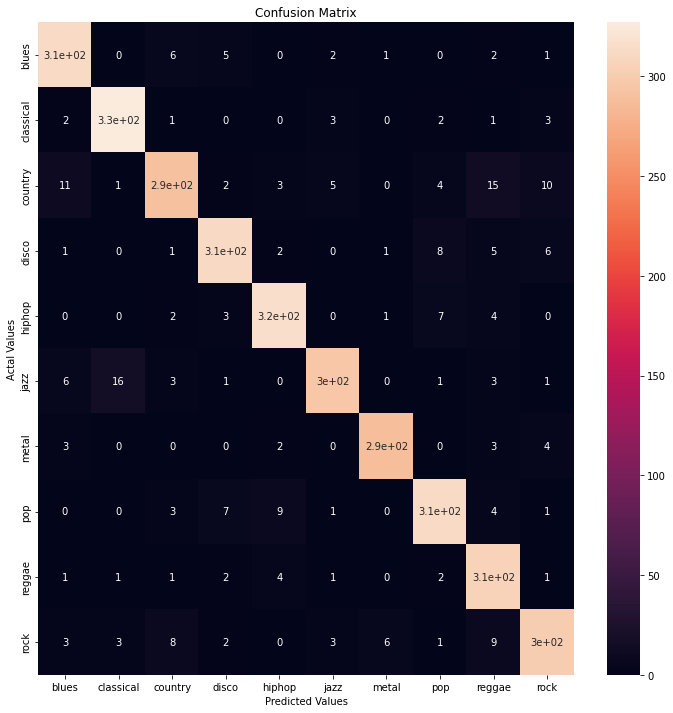

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


## **KNN (K-Nearest Neighbours)**

### Finding the optimal value of k

In [ ]:
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X, y, test_size=0.33, random_state=42)

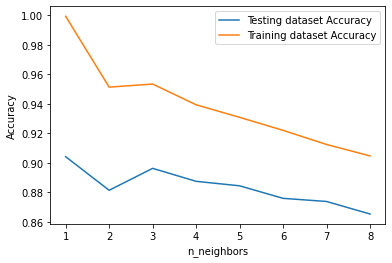

In [ ]:
neighbors = np.arange(1, 9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
 
# Loop over K values
for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_knn, y_train_knn)
     
    # Compute training and test data accuracy
    train_accuracy[i] = knn.score(X_train_knn, y_train_knn)
    test_accuracy[i] = knn.score(X_test_knn, y_test_knn)
 
# Generate plot
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
 
plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

### Building the Model using KNN

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=3) 
knn_model.fit(X_train_knn, y_train_knn)

KNeighborsClassifier(n_neighbors=3)

### Evaluating the Model

In [ ]:
print(knn_model.score(X_test_knn, y_test_knn)*100)

89.62693357597816


### Testing the Model using samples of the test set

In [ ]:
predicted_index = knn_model.predict(X_test_knn)[178]
y_pred = dict[predicted_index]
target = dict[y_test_knn[178]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: rock, Predicted label: rock


In [ ]:
predicted_index = knn_model.predict(X_test_knn)[65]
y_pred = dict[predicted_index]
target = dict[y_test_knn[65]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: disco, Predicted label: disco


In [ ]:
predicted_index = knn_model.predict(X_test_knn)[47]
y_pred = dict[predicted_index]
target = dict[y_test_knn[47]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: metal, Predicted label: metal


In [ ]:
predicted_index = knn_model.predict(X_test_knn)[220]
y_pred = dict[predicted_index]
target = dict[y_test_knn[220]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: classical, Predicted label: classical


In [ ]:
predicted_index = knn_model.predict(X_test_knn)[500]
y_pred = dict[predicted_index]
target = dict[y_test_knn[500]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: reggae, Predicted label: reggae


In [ ]:
predicted_index = knn_model.predict(X_test_knn)[340]
y_pred = dict[predicted_index]
target = dict[y_test_knn[340]]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: blues, Predicted label: blues


### Confusion Matrix for KNN model

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
y_pred = knn.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm,
                     index = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'], 
                     columns = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock'])



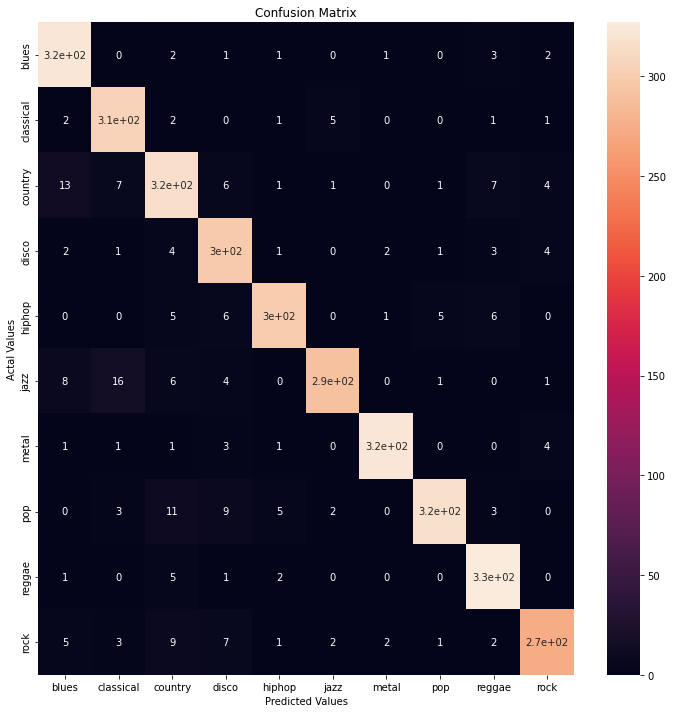

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

### Testing the model on an external audio file

In [ ]:
pip install python_speech_features

  Created wheel for python-speech-features: filename=python_speech_features-0.6-py3-none-any.whl size=5888 sha256=bb5b22a53a87a3bed99ea0dfd465e87f32acbd919fe2f642676fde22ee37619a
  Stored in directory: /root/.cache/pip/wheels/b0/0e/94/28cd6afa3cd5998a63eef99fe31777acd7d758f59cf24839eb
Successfully built python-speech-features


In [ ]:
pip install pydub

In [ ]:
pwd

'/content/drive/My Drive/Data'

### Loading the Audio file

In [ ]:
from pydub import AudioSegment
sound = AudioSegment.from_mp3("/content/drive/My Drive/Data/Taylor Swift-Love Story.mp3")
sound.export("/content/drive/My Drive/Data/Taylor-Swift-Love-Story.wav", format="wav")

<_io.BufferedRandom name='/content/drive/My Drive/Data/Taylor-Swift-Love-Story.wav'>

In [ ]:
import IPython
x, sr = librosa.load('/content/drive/My Drive/Data/Taylor-Swift-Love-Story.wav')
IPython.display.Audio(x, rate=sr)

### Extracting the Features of the external Audio File

In [ ]:
spectral_centroids_mean = librosa.feature.spectral_centroid(x, sr=sr).mean()
spectral_centroids_var = librosa.feature.spectral_centroid(x, sr=sr).var()
print(spectral_centroids_mean)
print(spectral_centroids_var)

2533.4590123552734
892677.4864299232


In [ ]:
rms_mean = librosa.feature.rms(x).mean()
print(rms_mean)
rms_var = librosa.feature.rms(x).var()
print(rms_var)

0.028298043
0.00016748595


In [ ]:
chroma_stft_mean = librosa.feature.chroma_stft(x).mean()
print(chroma_stft_mean)
chroma_stft_var = librosa.feature.chroma_stft(x).var()
print(chroma_stft_var)

0.35791284
0.086682275


In [ ]:
spectral_bandwidth_mean = librosa.feature.spectral_bandwidth(x).mean()
print(spectral_bandwidth_mean)
spectral_bandwidth_var = librosa.feature.spectral_bandwidth(x).var()
print(spectral_bandwidth_var)

2639.61029964089
319091.35228837444


In [ ]:
rolloff_mean = librosa.feature.spectral_rolloff(x).mean()
print(rolloff_mean)
rolloff_var = librosa.feature.spectral_rolloff(x).var()
print(rolloff_var)

5396.92100254537
3849096.344928492


In [ ]:
zero_cross_rate_mean = librosa.feature.zero_crossing_rate(x).mean()
print(zero_cross_rate_mean)
zero_cross_rate_var = librosa.feature.zero_crossing_rate(x).var()
print(zero_cross_rate_var)

0.11866523740428978
0.004673091258403798


In [ ]:
y_harm, y_perc = librosa.effects.hpss(x)
harmony_mean = y_harm.mean()
print(harmony_mean)
harmony_var = y_harm.var()
print(harmony_var)
perceptr_mean = y_perc.mean()
print(perceptr_mean)
perceptr_var = y_perc.var()
print(perceptr_var)

4.6889824e-08
0.00054128096
2.4005124e-06
0.0001928906


In [ ]:
tempo, _ = librosa.beat.beat_track(x)
print(tempo)

117.45383522727273


In [ ]:
mfcc1_mean = librosa.feature.mfcc(x)[0].mean()
print(mfcc1_mean)
mfcc1_var = librosa.feature.mfcc(x)[0].var()
print(mfcc1_var)
mfcc2_mean = librosa.feature.mfcc(x)[1].mean()
print(mfcc2_mean)
mfcc2_var = librosa.feature.mfcc(x)[1].var()
print(mfcc2_var)
mfcc3_mean = librosa.feature.mfcc(x)[2].mean()
print(mfcc3_mean)
mfcc3_var = librosa.feature.mfcc(x)[2].var()
print(mfcc3_var)
mfcc4_mean = librosa.feature.mfcc(x)[3].mean()
print(mfcc4_mean)
mfcc4_var = librosa.feature.mfcc(x)[3].var()
print(mfcc4_var)
mfcc5_mean = librosa.feature.mfcc(x)[4].mean()
print(mfcc5_mean)
mfcc5_var = librosa.feature.mfcc(x)[4].var()
print(mfcc5_var)
mfcc6_mean = librosa.feature.mfcc(x)[5].mean()
print(mfcc6_mean)
mfcc6_var = librosa.feature.mfcc(x)[5].var()
print(mfcc6_var)
mfcc7_mean = librosa.feature.mfcc(x)[6].mean()
print(mfcc7_mean)
mfcc7_var = librosa.feature.mfcc(x)[6].var()
print(mfcc7_var)
mfcc8_mean = librosa.feature.mfcc(x)[7].mean()
print(mfcc8_mean)
mfcc8_var = librosa.feature.mfcc(x)[7].var()
print(mfcc8_var)
mfcc9_mean = librosa.feature.mfcc(x)[8].mean()
print(mfcc9_mean)
mfcc9_var = librosa.feature.mfcc(x)[8].var()
print(mfcc9_var)
mfcc10_mean = librosa.feature.mfcc(x)[9].mean()
print(mfcc10_mean)
mfcc10_var = librosa.feature.mfcc(x)[9].var()
print(mfcc10_var)
mfcc11_mean = librosa.feature.mfcc(x)[10].mean()
print(mfcc11_mean)
mfcc11_var = librosa.feature.mfcc(x)[10].var()
print(mfcc11_var)
mfcc12_mean = librosa.feature.mfcc(x)[11].mean()
print(mfcc1_mean)
mfcc12_var = librosa.feature.mfcc(x)[11].var()
print(mfcc12_var)
mfcc13_mean = librosa.feature.mfcc(x)[12].mean()
print(mfcc13_mean)
mfcc13_var = librosa.feature.mfcc(x)[12].var()
print(mfcc13_var)
mfcc14_mean = librosa.feature.mfcc(x)[13].mean()
print(mfcc14_mean)
mfcc14_var = librosa.feature.mfcc(x)[13].var()
print(mfcc14_var)
mfcc15_mean = librosa.feature.mfcc(x)[14].mean()
print(mfcc15_mean)
mfcc15_var = librosa.feature.mfcc(x)[14].var()
print(mfcc15_var)
mfcc16_mean = librosa.feature.mfcc(x)[15].mean()
print(mfcc1_mean)
mfcc16_var = librosa.feature.mfcc(x)[15].var()
print(mfcc1_var)
mfcc17_mean = librosa.feature.mfcc(x)[16].mean()
print(mfcc17_mean)
mfcc17_var = librosa.feature.mfcc(x)[16].var()
print(mfcc17_var)
mfcc18_mean = librosa.feature.mfcc(x)[17].mean()
print(mfcc18_mean)
mfcc18_var = librosa.feature.mfcc(x)[17].var()
print(mfcc18_var)
mfcc19_mean = librosa.feature.mfcc(x)[18].mean()
print(mfcc19_mean)
mfcc19_var = librosa.feature.mfcc(x)[18].var()
print(mfcc19_var)
mfcc20_mean = librosa.feature.mfcc(x)[19].mean()
print(mfcc20_mean)
mfcc20_var = librosa.feature.mfcc(x)[19].var()
print(mfcc20_var)

-263.90494
13771.427
86.962036
1230.8207
10.646607
330.66675
24.381275
266.22623
2.7317228
113.85414
5.9404516
152.67003
3.9440901
101.676674
1.4757458
106.074455
6.93234
85.8375
1.2594401
96.27488
-2.0993247
64.67288
-263.90494
82.98491
-2.1745787
67.16098
0.24598162
47.287506
-6.864835
57.258057
-263.90494
13771.427
-2.7883763
51.968742
-1.3049623
65.82242
-5.8784842
68.39747
-2.050487
71.08866


In [ ]:
x.size

5215266

### Preprocessing Data

In [ ]:
f = [x.size, chroma_stft_mean, chroma_stft_var, rms_mean, rms_var, spectral_centroids_mean, spectral_centroids_var, spectral_bandwidth_mean, spectral_bandwidth_var, rolloff_mean, rolloff_var, zero_cross_rate_mean, zero_cross_rate_var, harmony_mean, harmony_var, perceptr_mean, perceptr_var, tempo, mfcc1_mean, mfcc1_var, mfcc2_mean, mfcc2_var, mfcc3_mean, mfcc3_var, mfcc4_mean, mfcc4_var, mfcc5_mean, mfcc5_var, mfcc6_mean, mfcc6_var, mfcc7_mean, mfcc7_var, mfcc8_mean, mfcc8_var, mfcc9_mean, mfcc9_var, mfcc10_mean, mfcc10_var, mfcc11_mean, mfcc11_var, mfcc12_mean, mfcc12_var, mfcc13_mean, mfcc13_var, mfcc14_mean, mfcc14_var, mfcc15_mean, mfcc15_var, mfcc16_mean, mfcc16_var, mfcc17_mean, mfcc17_var, mfcc18_mean, mfcc18_var, mfcc19_mean, mfcc19_var, mfcc20_mean, mfcc20_var]
feature = pd.DataFrame([f], columns=['length','chroma_stft_mean','chroma_stft_var', 'rms_mean', 'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var', 'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean', 'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var', 'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo', 'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var', 'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean', 'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var', 'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean', 'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var', 'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean', 'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var'])

In [ ]:
from sklearn.preprocessing import StandardScaler
fit = StandardScaler()
X1 = np.array(feature.iloc[:,:], dtype = float)
X1

array([[ 5.21526600e+06,  3.57912838e-01,  8.66822749e-02,
         2.82980427e-02,  1.67485952e-04,  2.53345901e+03,
         8.92677486e+05,  2.63961030e+03,  3.19091352e+05,
         5.39692100e+03,  3.84909634e+06,  1.18665237e-01,
         4.67309126e-03,  4.68898236e-08,  5.41280955e-04,
         2.40051236e-06,  1.92890599e-04,  1.17453835e+02,
        -2.63904938e+02,  1.37714268e+04,  8.69620361e+01,
         1.23082068e+03,  1.06466074e+01,  3.30666748e+02,
         2.43812752e+01,  2.66226227e+02,  2.73172283e+00,
         1.13854141e+02,  5.94045162e+00,  1.52670029e+02,
         3.94409013e+00,  1.01676674e+02,  1.47574580e+00,
         1.06074455e+02,  6.93234015e+00,  8.58375015e+01,
         1.25944006e+00,  9.62748795e+01, -2.09932470e+00,
         6.46728821e+01,  4.05717897e+00,  8.29849091e+01,
        -2.17457867e+00,  6.71609802e+01,  2.45981619e-01,
         4.72875061e+01, -6.86483479e+00,  5.72580566e+01,
         7.91792125e-02,  6.09577904e+01, -2.78837633e+0

In [ ]:
X1[0].shape

(58,)

### Prediction

### Prediction Using CNN Model

In [ ]:
# pick a sample to predict from the test set
X_to_predict = X1[0]
y_to_predict = 9

# predict sample
predict(model, X_to_predict, y_to_predict)

Target: rock, Predicted label: rock


### Prediction Using KNN Model

In [ ]:
predicted_index = knn_model.predict(X1)[0]
predicted_index
y_pred = dict[predicted_index]
target = dict[9]
print("Target: {}, Predicted label: {}".format(target, y_pred))

Target: rock, Predicted label: rock
